# Classification Task

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from collections import defaultdict

In [2]:
# Load dataset.
tracks = pd.read_csv('data/fma_metadata/tracks_processed_filled.csv')

columns2drop = ['Unnamed: 0', 'track_id', 'artist_id']

tracks.drop(columns2drop, inplace=True, axis=1)

tracks.shape

(106486, 40)

In [3]:
tracks.head() #Display the first 5 objects of the dataset

,album_comments,album_favorites,album_id,album_listens,album_tracks,album_type,artist_comments,artist_favorites,artist_location,artist_name,...,artist_date_created_year,artist_date_created_month,artist_date_created_day,artist_date_created_daytime,track_date_created_year,track_date_created_month,track_date_created_day,track_date_created_daytime,track_date_recorded_daytime,Attribution-NonCommercial-ShareAlike 3.0 International
0,0,4,1,6073,7,0,0,9,1323,299,...,2008.0,11.0,26.0,3,2008,11,26,3,0,1
1,0,4,1,6073,7,0,0,9,1323,299,...,2008.0,11.0,26.0,3,2008,11,26,3,0,1
2,0,4,1,6073,7,0,0,9,1323,299,...,2008.0,11.0,26.0,3,2008,11,26,3,0,1
3,0,4,6,47632,2,0,3,74,343,7419,...,2008.0,11.0,26.0,3,2008,11,25,0,0,0
4,0,2,4,2710,13,0,2,10,523,9551,...,2008.0,11.0,26.0,3,2008,11,26,3,0,0


In [4]:
tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106486 entries, 0 to 106485
Data columns (total 40 columns):
 #   Column                                                  Non-Null Count   Dtype  
---  ------                                                  --------------   -----  
 0   album_comments                                          106486 non-null  int64  
 1   album_favorites                                         106486 non-null  int64  
 2   album_id                                                106486 non-null  int64  
 3   album_listens                                           106486 non-null  int64  
 4   album_tracks                                            106486 non-null  int64  
 5   album_type                                              106486 non-null  int64  
 6   artist_comments                                         106486 non-null  int64  
 7   artist_favorites                                        106486 non-null  int64  
 8   artist_location         

### Data Partitioning

In [5]:
from sklearn.model_selection import train_test_split, cross_val_score 

Split the dataset into 70% train and 30% test

In [6]:
class_name = 'Attribution-NonCommercial-ShareAlike 3.0 International'

attributes = [col for col in tracks.columns if col != class_name]

X = tracks[attributes].values
y = tracks[class_name]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100, stratify=y)

In [7]:
X_train.shape, X_test.shape

((74540, 39), (31946, 39))

In [8]:
tracks[class_name].value_counts()

0    91226
1    15260
Name: Attribution-NonCommercial-ShareAlike 3.0 International, dtype: int64

In [9]:
15260/(15260+91226)

0.14330522322183198

### Decision Tree

In [10]:
from sklearn.tree import DecisionTreeClassifier

Build the decision tree

Parameters:
* **criterion** (default 'gini'): The function to measure the quality of a split. Available: gini, entropy.
* **max_depth** (default None): The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
* **min_samples_split** (default 2): The minimum number of samples required to split an internal node.
* **min_samples_leaf** (default 1): The minimum number of samples required to be at a leaf node.

In [11]:
clf = DecisionTreeClassifier(criterion='gini',
                             max_depth=None,
                             min_samples_split=2,
                             min_samples_leaf=1,
                             random_state=0)

clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

Output:
* **feature\_importances_**: The feature importances. The higher, the more important the feature.
* **tree_**: The underlying Tree object.

Features Importance

In [12]:
for col, imp in zip(attributes, clf.feature_importances_):
    print(col, imp)

album_comments 0.014485531679453859
album_favorites 0.01156833121526073
album_id 0.13962010315851517
album_listens 0.04381928847368719
album_tracks 0.042910735178972835
album_type 0.011653893144048074
artist_comments 0.010938217925669097
artist_favorites 0.028993390563909982
artist_id 0.056903874866786545
artist_location 0.04166410177002361
artist_name 0.03795795484127517
artist_tags 0.02960836809688529
track_bit_rate 0.01878686947485151
track_comments 0.0007878498580345444
track_duration 0.013406817474936595
track_favorites 0.004191623317724777
track_genres 0.05863747999621399
track_genres_all 0.06864059564209078
track_interest 0.03900529500517746
track_listens 0.027536169909980413
track_number 0.008801486146201406
track_tags 0.01150490475304312
track_title 0.007449312353248814
album_date_created_year 0.037677204387558
album_date_created_month 0.01289175099554936
album_date_created_day 0.01260215699374267
album_date_created_daytime 0.007045176760247206
album_date_released_year 0.04970

In [13]:
#Create a DataFrame for feature importances using a Dictionary
importances = {'feature_name': attributes, 'feature_importance': clf.feature_importances_}
importance_tracks = pd.DataFrame(importances)

#Sort the DataFrame in order decreasing feature importance
importance_tracks.sort_values(by=['feature_importance'], ascending=False, inplace=True)

Text(0, 0.5, 'FEATURE NAMES')

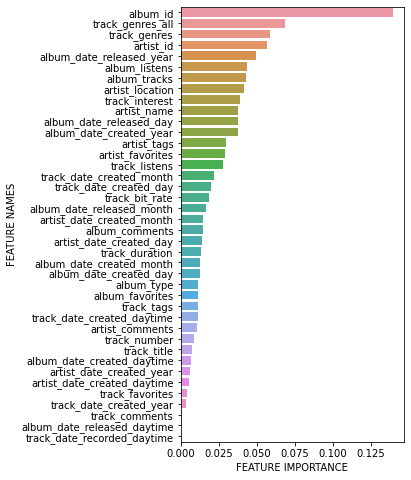

In [14]:
plt.figure(figsize=(4,8))
sns.barplot(x=importance_tracks['feature_importance'], y=importance_tracks['feature_name'])
plt.xlabel('FEATURE IMPORTANCE')
plt.ylabel('FEATURE NAMES')

Visualize the decision tree

In [35]:
import pydotplus
from sklearn import tree
from IPython.display import Image

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.268142 to fit



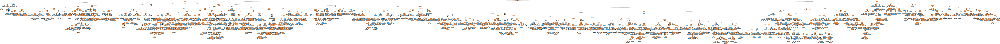

In [16]:
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=attributes, 
                                class_names=['license_yes' if x == 1 else 'license_no' for x in clf.classes_], 
                                filled=True, rounded=True, 
                                special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

#### Analyze the classification performance

In [16]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, classification_report, precision_score, recall_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

Apply the decision tree on the training set

In [16]:
y_pred = clf.predict(X_train)

Evaluate the performance

In [17]:
print('Train Accuracy %s' % accuracy_score(y_train, y_pred))
print('Train F1-score %s' % f1_score(y_train, y_pred, average=None))
print('Train Precision %s' % precision_score(y_train, y_pred, average=None))
print('Train Recall %s' % recall_score(y_train, y_pred, average=None))

Train Accuracy 1.0
Train F1-score [1. 1.]
Train Precision [1. 1.]
Train Recall [1. 1.]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     63858
           1       1.00      1.00      1.00     10682

    accuracy                           1.00     74540
   macro avg       1.00      1.00      1.00     74540
weighted avg       1.00      1.00      1.00     74540



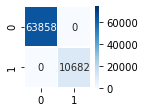

In [18]:
print(classification_report(y_train, y_pred))
cf_matrix_train = confusion_matrix(y_train, y_pred)

f,ax = plt.subplots(figsize=(1.5,1.5))
sns.heatmap(cf_matrix_train, annot=True, cmap="Blues", linewidths=0.5,
            linecolor="white", fmt="", vmin=0, vmax=74540, ax=ax)
plt.show()

Apply the decision tree on the test set and evaluate the performance

In [19]:
y_pred = clf.predict(X_test)

Test Accuracy 0.9713266136605522
Test F1-score [0.98324615 0.9006292 ]
Test Precision [0.98436241 0.89461207]
Test Recall [0.98213242 0.90672783]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     27368
           1       0.89      0.91      0.90      4578

    accuracy                           0.97     31946
   macro avg       0.94      0.94      0.94     31946
weighted avg       0.97      0.97      0.97     31946



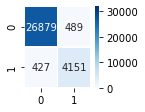

In [20]:
print('Test Accuracy %s' % accuracy_score(y_test, y_pred))
print('Test F1-score %s' % f1_score(y_test, y_pred, average=None))
print('Test Precision %s' % precision_score(y_test, y_pred, average=None))
print('Test Recall %s' % recall_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))
cf_matrix_test = confusion_matrix(y_test, y_pred)

f,ax = plt.subplots(figsize=(1.5,1.5))
sns.heatmap(cf_matrix_test, annot=True, cmap="Blues", linewidths=0.5,
            linecolor="white", fmt="", vmin=0, vmax=31946, ax=ax)
plt.show()

Draw ROC curve

In [21]:
y_score = clf.predict_proba(X_test)
fpr0, tpr0, _ = roc_curve(y_test, y_score[:, 1])
roc_auc0 = auc(fpr0, tpr0)

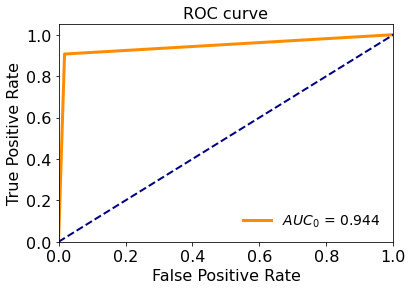

In [22]:
plt.plot(fpr0, tpr0, color='darkorange', lw=3, label='$AUC_0$ = %.3f' % (roc_auc0))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

In [15]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

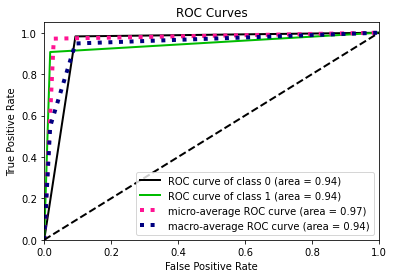

In [24]:
plot_roc(y_test, y_score)
plt.show()

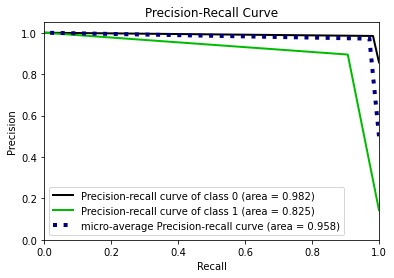

In [25]:
plot_precision_recall(y_test, y_score)
plt.show()

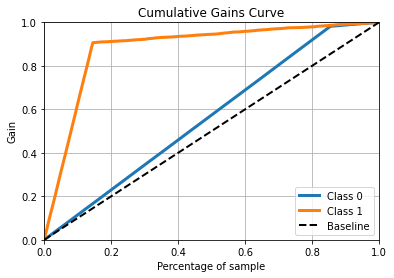

In [26]:
plot_cumulative_gain(y_test, y_score)
plt.show()

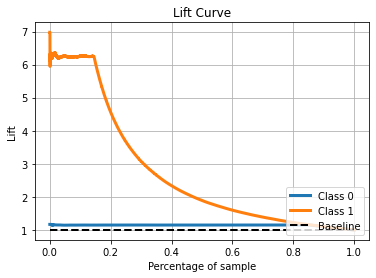

In [27]:
plot_lift_curve(y_test, y_score)
plt.show()

#### Cross Validation

In [28]:
from sklearn.model_selection import cross_val_score

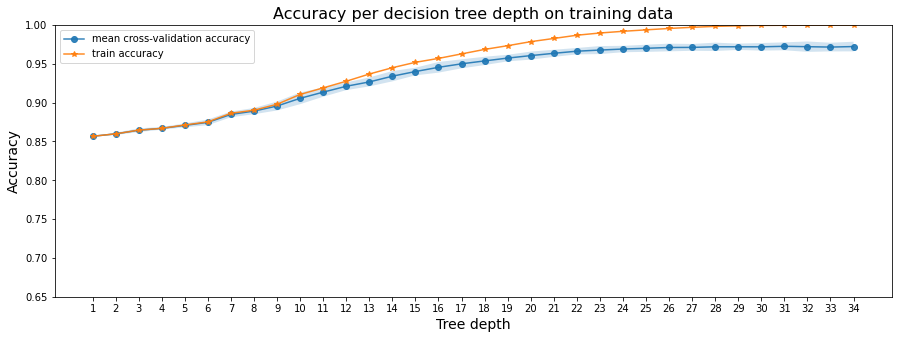

In [29]:
# Function for fitting trees of various depths on the training data using cross-validation
def run_cross_validation_on_trees(X, y, tree_depths, cv=10, scoring='accuracy'):
    cv_scores_list = []
    cv_scores_std = []
    cv_scores_mean = []
    accuracy_scores = []
    for depth in tree_depths:
        tree_model = DecisionTreeClassifier(max_depth=depth)
        cv_scores = cross_val_score(tree_model, X, y, cv=cv, scoring=scoring)
        cv_scores_list.append(cv_scores)
        cv_scores_mean.append(cv_scores.mean())
        cv_scores_std.append(cv_scores.std())
        accuracy_scores.append(tree_model.fit(X, y).score(X, y))
    cv_scores_mean = np.array(cv_scores_mean)
    cv_scores_std = np.array(cv_scores_std)
    accuracy_scores = np.array(accuracy_scores)
    return cv_scores_mean, cv_scores_std, accuracy_scores
  
# function for plotting cross-validation results
def plot_cross_validation_on_trees(depths, cv_scores_mean, cv_scores_std, accuracy_scores, title):
    fig, ax = plt.subplots(1,1, figsize=(15,5))
    ax.plot(depths, cv_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
    ax.fill_between(depths, cv_scores_mean-2*cv_scores_std, cv_scores_mean+2*cv_scores_std, alpha=0.2)
    ylim = plt.ylim()
    ax.plot(depths, accuracy_scores, '-*', label='train accuracy', alpha=0.9)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Tree depth', fontsize=14)
    ax.set_ylabel('Accuracy', fontsize=14)
    ax.set_ylim(0.65, 1)
    ax.set_xticks(depths)
    ax.legend()

# fitting trees of depth 1 to 24
sm_tree_depths = range(1,35)
sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores = run_cross_validation_on_trees(X_train, y_train, sm_tree_depths)

# plotting accuracy
plot_cross_validation_on_trees(sm_tree_depths, sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores, 
                               'Accuracy per decision tree depth on training data')

Tuning hyper-parameters by Randomized Search Cross Validation

In [31]:
from sklearn.model_selection import RandomizedSearchCV

In [32]:
def report(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                  results['mean_test_score'][candidate],
                  results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")

In [33]:
param_list = {'max_depth': [None] + list(np.arange(2, 40)),
              'min_samples_split': [2, 5, 10, 20, 30, 50, 100],
              'min_samples_leaf': [1, 5, 10, 20, 30, 50, 100],
              'criterion': ['gini', 'entropy']
             }

random_search = RandomizedSearchCV(clf, param_distributions=param_list, 
                                   n_iter=100, cv=5, random_state=0)
random_search.fit(X, y)
clf = random_search.best_estimator_

In [34]:
report(random_search.cv_results_, n_top=3)

Model with rank: 1
Mean validation score: 0.692 (std: 0.330)
Parameters: {'min_samples_split': 10, 'min_samples_leaf': 30, 'max_depth': 2, 'criterion': 'entropy'}

Model with rank: 2
Mean validation score: 0.601 (std: 0.334)
Parameters: {'min_samples_split': 30, 'min_samples_leaf': 20, 'max_depth': 3, 'criterion': 'entropy'}

Model with rank: 3
Mean validation score: 0.600 (std: 0.333)
Parameters: {'min_samples_split': 10, 'min_samples_leaf': 30, 'max_depth': 4, 'criterion': 'entropy'}

Model with rank: 3
Mean validation score: 0.600 (std: 0.333)
Parameters: {'min_samples_split': 5, 'min_samples_leaf': 100, 'max_depth': 4, 'criterion': 'entropy'}

Model with rank: 3
Mean validation score: 0.600 (std: 0.333)
Parameters: {'min_samples_split': 30, 'min_samples_leaf': 100, 'max_depth': 4, 'criterion': 'entropy'}



#### Decision Tree Classifier with Optimizied Parameters

In [30]:
clf = DecisionTreeClassifier(criterion='entropy',
                             max_depth=10,
                             min_samples_split=10,
                             min_samples_leaf=30,
                             random_state=0)

clf.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=30,
                       min_samples_split=10, random_state=0)

In [31]:
for col, imp in zip(attributes, clf.feature_importances_):
    print(col, imp)

album_comments 0.010270185334149607
album_favorites 0.007847697251458076
album_id 0.179315087065423
album_listens 0.011485084465269668
album_tracks 0.027936163120092734
album_type 0.023854196186474236
artist_comments 0.016859151569584296
artist_favorites 0.014311649099296636
artist_id 0.04648110683918998
artist_location 0.011840387540730314
artist_name 0.021481972492703335
artist_tags 0.0055816829592824704
track_bit_rate 0.022269913657508567
track_comments 0.0
track_duration 0.0010795925455647942
track_favorites 0.0
track_genres 0.043896123693498865
track_genres_all 0.10389494611930378
track_interest 0.08528308086969068
track_listens 0.05463402638977289
track_number 0.00027782009222615566
track_tags 0.0028625104569104456
track_title 0.0
album_date_created_year 0.11870801694864491
album_date_created_month 0.002745616485701587
album_date_created_day 0.008488259023327546
album_date_created_daytime 0.0034701548972708393
album_date_released_year 0.0427286751608718
album_date_released_month 

In [32]:
#Create a DataFrame for feature importances using a Dictionary
importances = {'feature_name': attributes, 'feature_importance': clf.feature_importances_}
importance_tracks = pd.DataFrame(importances)

#Sort the DataFrame in order decreasing feature importance
importance_tracks.sort_values(by=['feature_importance'], ascending=False, inplace=True)

Text(0, 0.5, 'FEATURE NAMES')

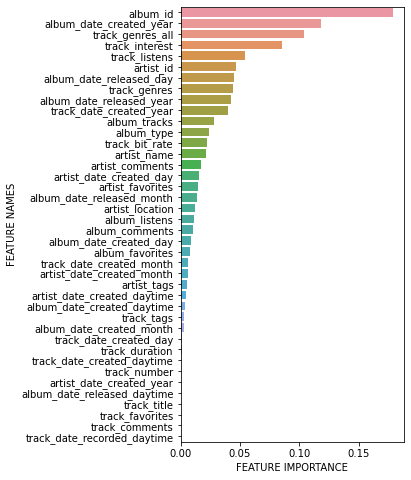

In [33]:
plt.figure(figsize=(4,8))
sns.barplot(x=importance_tracks['feature_importance'], y=importance_tracks['feature_name'])
plt.xlabel('FEATURE IMPORTANCE')
plt.ylabel('FEATURE NAMES')

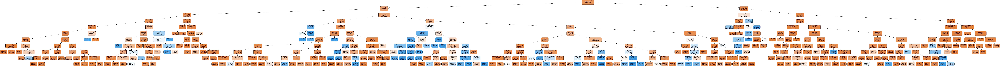

In [36]:
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=attributes, 
                                class_names=['license_yes' if x == 1 else 'license_no' for x in clf.classes_], 
                                filled=True, rounded=True, 
                                special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [37]:
y_pred = clf.predict(X_train)

Train Accuracy 0.9019586799034076
Train F1-score [0.94522314 0.53351206]
Train Precision [0.90650699 0.83848315]
Train Recall [0.98739391 0.39121887]
              precision    recall  f1-score   support

           0       0.91      0.99      0.95     63858
           1       0.84      0.39      0.53     10682

    accuracy                           0.90     74540
   macro avg       0.87      0.69      0.74     74540
weighted avg       0.90      0.90      0.89     74540



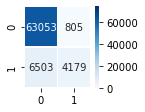

In [38]:
print('Train Accuracy %s' % accuracy_score(y_train, y_pred))
print('Train F1-score %s' % f1_score(y_train, y_pred, average=None))
print('Train Precision %s' % precision_score(y_train, y_pred, average=None))
print('Train Recall %s' % recall_score(y_train, y_pred, average=None))

print(classification_report(y_train, y_pred))
cf_matrix_train = confusion_matrix(y_train, y_pred)

f,ax = plt.subplots(figsize=(1.5,1.5))
sns.heatmap(cf_matrix_train, annot=True, cmap="Blues", linewidths=0.5,
            linecolor="white", fmt="", vmin=0, vmax=74601, ax=ax)
plt.show()

In [39]:
y_pred = clf.predict(X_test)

Test Accuracy 0.8962937456958617
Test F1-score [0.94203482 0.50823809]
Test Precision [0.90378353 0.7929597 ]
Test Recall [0.98366706 0.37396243]
              precision    recall  f1-score   support

           0       0.90      0.98      0.94     27368
           1       0.79      0.37      0.51      4578

    accuracy                           0.90     31946
   macro avg       0.85      0.68      0.73     31946
weighted avg       0.89      0.90      0.88     31946



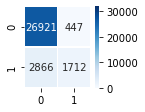

In [40]:
print('Test Accuracy %s' % accuracy_score(y_test, y_pred))
print('Test F1-score %s' % f1_score(y_test, y_pred, average=None))
print('Test Precision %s' % precision_score(y_test, y_pred, average=None))
print('Test Recall %s' % recall_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))
cf_matrix_test = confusion_matrix(y_test, y_pred)

f,ax = plt.subplots(figsize=(1.5,1.5))
sns.heatmap(cf_matrix_test, annot=True, cmap="Blues", linewidths=0.5,
            linecolor="white", fmt="", vmin=0, vmax=31973, ax=ax)
plt.show()

In [41]:
y_score = clf.predict_proba(X_test)
fpr0, tpr0, _ = roc_curve(y_test, y_score[:, 1])
roc_auc0 = auc(fpr0, tpr0)

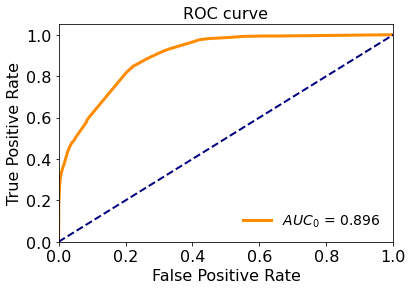

In [42]:
plt.plot(fpr0, tpr0, color='darkorange', lw=3, label='$AUC_0$ = %.3f' % (roc_auc0))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

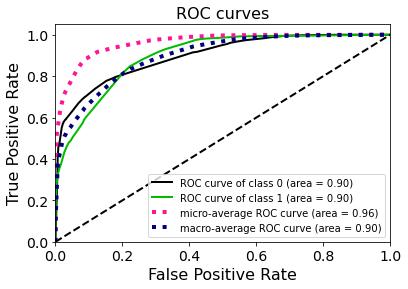

In [43]:
plot_roc(y_test, y_score)
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curves', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.show()

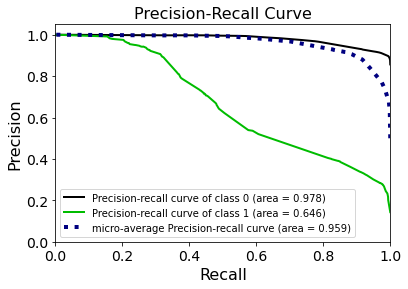

In [44]:
plot_precision_recall(y_test, y_score)
plt.xlabel('Recall', fontsize=16)
plt.ylabel('Precision', fontsize=16)
plt.title('Precision-Recall Curve', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.show()

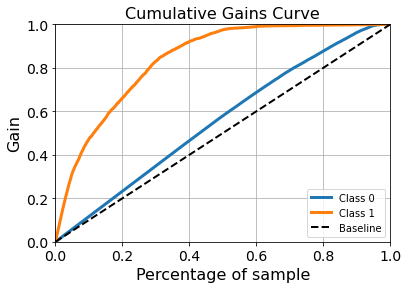

In [45]:
plot_cumulative_gain(y_test, y_score)
plt.xlabel('Percentage of sample', fontsize=16)
plt.ylabel('Gain', fontsize=16)
plt.title('Cumulative Gains Curve', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.show()

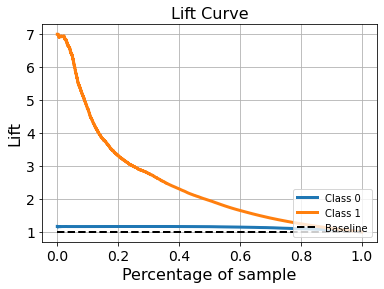

In [46]:
plot_lift_curve(y_test, y_score)
plt.xlabel('Percentage of sample', fontsize=16)
plt.ylabel('Lift', fontsize=16)
plt.title('Lift Curve', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.show()